In [1]:
import scanpy as sc
from pathlib import Path
import pandas as pd
import os
import numpy as np
import matplotlib.pyplot as plt
import pickle
import seaborn as sns
from scipy.stats import spearmanr
from cell2location import run_colocation
import seaborn as sns
from sklearn.feature_selection import chi2
from scipy.stats.contingency import odds_ratio
from matplotlib.patches import Patch
%matplotlib inline

# Ventricle

In [29]:
ventricle_sc = sc.read_h5ad("heart_ven/ncell7_alpha20/sp.h5ad")

In [30]:
celltypes = ventricle_sc.uns['mod']['factor_names']
ventricle_sc.obs[ventricle_sc.uns['mod']['factor_names']] = ventricle_sc.obsm['q95_cell_abundance_w_sf']
for celltype in celltypes:
    if f'{celltype}_ori' in ventricle_sc.obs.columns:
        ventricle_sc.obs = ventricle_sc.obs.drop(f'{celltype}_ori', axis=1)
    ventricle_sc.obs = ventricle_sc.obs.rename({celltype: f'{celltype}_ori'}, axis=1)
    ventricle_sc.obs[f'{celltype}'] = ventricle_sc.obs[f'{celltype}_ori'].apply(lambda x:x if x >= 1.5 else 0)
# spots with at least two celltypes
ventricle_sc.obs['valid_celltypes_number'] = [(x>0).sum() for x in ventricle_sc.obs[celltypes].values]
ventricle_sc.obs['valid_celltypes_number'].value_counts()

valid_celltypes_number
1     7151
0     2151
2      679
3      272
4      117
5       76
6       64
7       34
8       15
9        9
10       1
Name: count, dtype: int64

In [31]:
nmf_ventricle_sc = ventricle_sc[ventricle_sc.obs['valid_celltypes_number'] >= 2].copy()
nmf_ventricle_sc.shape

(1267, 12450)

In [32]:
nmf_ventricle_sc.obs[celltypes].var(axis=0).sort_values()

endocardial_ec         0.003994
cap_lec                0.026795
Epithelial cells       0.042363
art_ec_1               0.097586
cap_pc                 0.201577
Lymphoid cells         0.325196
art_ec_2               0.492839
art_smc                0.628969
myo_cap_ec             0.638847
vCM                    0.654217
ven_ec_1               1.476685
Myeloid cells          2.048423
Fibroblasts            2.616045
smc_pc_intermediate    2.851770
B cells                5.134015
dtype: float64

In [33]:
nmf_ventricle_sc.uns['mod']['factor_names']

array(['B cells', 'Epithelial cells', 'Fibroblasts', 'Lymphoid cells',
       'Myeloid cells', 'art_ec_1', 'art_ec_2', 'art_smc', 'cap_lec',
       'cap_pc', 'endocardial_ec', 'myo_cap_ec', 'smc_pc_intermediate',
       'vCM', 'ven_ec_1'], dtype=object)

In [34]:
# nmf_ventricle_sc.obsm['q05_cell_abundance_w_sf'] = nmf_ventricle_sc.obsm['q05_cell_abundance_w_sf'].drop("q05cell_abundance_w_sf_vCM", axis=1)
# nmf_ventricle_sc.obsm['q05_cell_abundance_w_sf'] = nmf_ventricle_sc.obsm['q05_cell_abundance_w_sf'].drop("q05cell_abundance_w_sf_Epithelial cells", axis=1)
# nmf_ventricle_sc.uns['mod']['factor_names'] = ['B_cells', 'Fibroblasts', 'Lymphoid cells',
#        'Myeloid cells', 'art_ec_1', 'art_ec_2',
#        'art_smc', 'cap_pc', 'endocardial_ec', 'myo_cap_ec',
#        'smc_pc_intermediate', 'ven_ec_1', 'ven_ec_2']

In [35]:
nmf_ventricle_sc.uns['mod'].keys()

dict_keys(['date', 'factor_filter', 'factor_names', 'model_name', 'obs_names', 'post_sample_means', 'post_sample_q05', 'post_sample_q95', 'post_sample_stds', 'var_names'])

In [37]:
ventricle_res_dict, nmf_ventricle_sc = run_colocation(
    nmf_ventricle_sc,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': [5, 8, 12],
      'sample_name_col': 'sample',
      'n_restarts': 3,
        "cell_abundance_obsm": "q95_cell_abundance_w_sf",
    },
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.0000001}},
    export_args={'path': f'heart_ven/CoLocatedComb_specificcelltypes/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_5combinations_1267locations_15factors
### Analysis name: CoLocatedGroupsSklearnNMF_8combinations_1267locations_15factors
### Analysis name: CoLocatedGroupsSklearnNMF_12combinations_1267locations_15factors


/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


In [38]:
nmf_ventricle_sc.uns['mod']['factor_names']

array(['B cells', 'Epithelial cells', 'Fibroblasts', 'Lymphoid cells',
       'Myeloid cells', 'art_ec_1', 'art_ec_2', 'art_smc', 'cap_pc',
       'endocardial_ec', 'myo_cap_ec', 'smc_pc_intermediate', 'vCM',
       'ven_ec_1', 'ven_ec_2', 'ven_smc'], dtype=object)

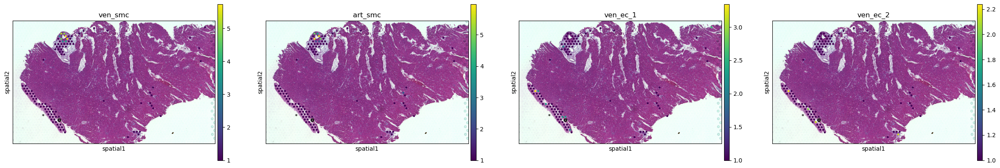

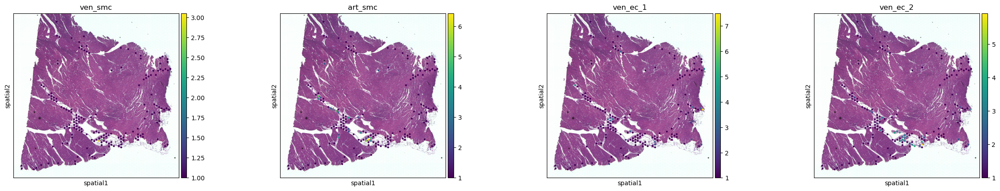

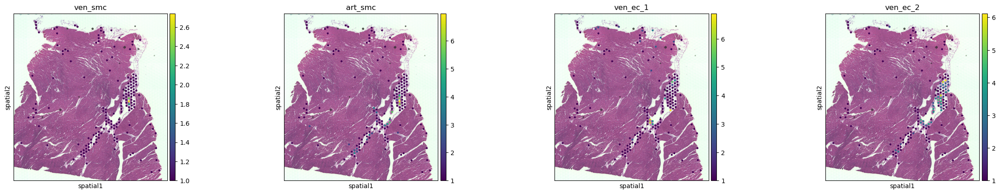

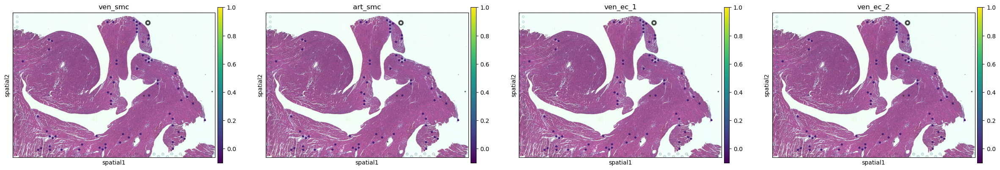

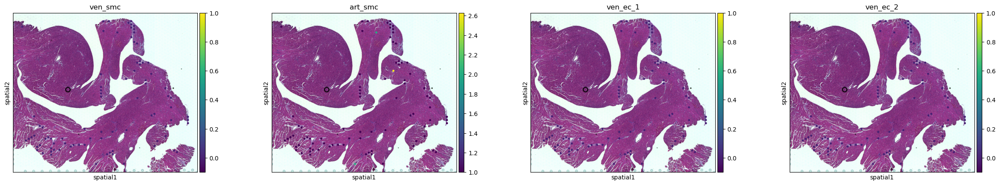

In [40]:
for samplename in nmf_ventricle_sc.obs['sample'].unique():
    sc.pl.spatial(nmf_ventricle_sc[nmf_ventricle_sc.obs['sample'] == samplename],
                  color=['ven_smc', 'art_smc', 'ven_ec_1', 'ven_ec_2'],
                  library_id=samplename, vmin=1, ncols=4)

In [55]:
# add annotation
manual_anno_dir = Path("/lustre/scratch126/cellgen/team205/sl37/vasculature/heart/heart_imagine_manual_annotations")
ventricle_samples = ventricle_sc.obs['sample'].unique()
ventricle_samplename_annotation_path_dic = {}
for samplename in ventricle_samples:
    if os.path.exists(manual_anno_dir/f'Annotation_{samplename}.csv'):
        ventricle_samplename_annotation_path_dic[samplename] = manual_anno_dir/f'Annotation_{samplename}.csv'
        
merged_annotation_df = pd.DataFrame()
for samplename in ventricle_samplename_annotation_path_dic.keys():
    annotation_df = pd.read_csv(ventricle_samplename_annotation_path_dic.get(samplename), index_col=0)
    annotation_df['cellbarcodes'] = [f'{samplename}_{x}' for x in annotation_df.index]
    merged_annotation_df = pd.concat([merged_annotation_df, annotation_df.set_index('cellbarcodes')], axis=0)
    
ventricle_sc.obs = ventricle_sc.obs.join(merged_annotation_df)
ventricle_sc.obs['Annotation'] = ventricle_sc.obs['Annotation'].astype('category')

ventricle_sc.obs['Annotation'].value_counts()

Annotation
Artery                  100
Vein                     75
Endocardium              63
Likely endocardium       34
Likely vein              17
Likely artery            11
Adventitia                7
Both A-V                  4
Likely both A-V           2
Small vessel SEMA3G+      1
Name: count, dtype: int64

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


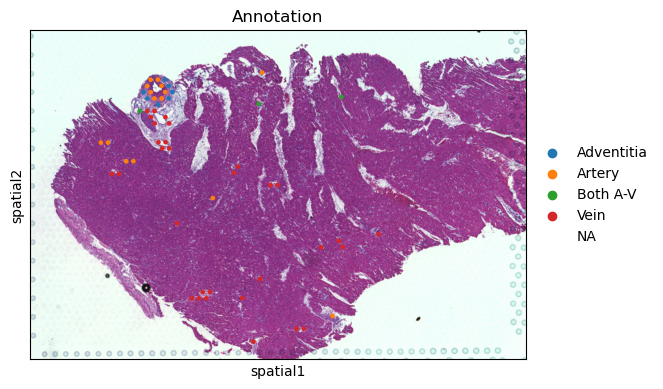

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


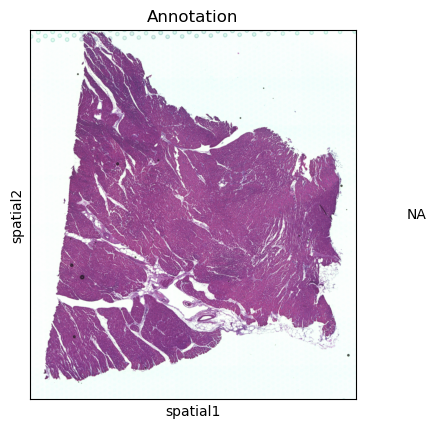

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


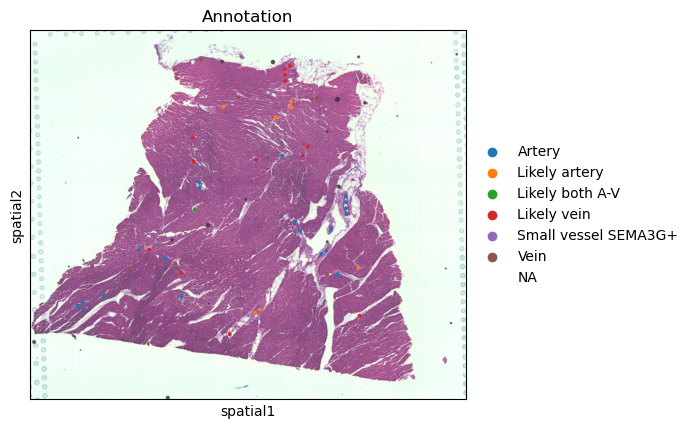

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


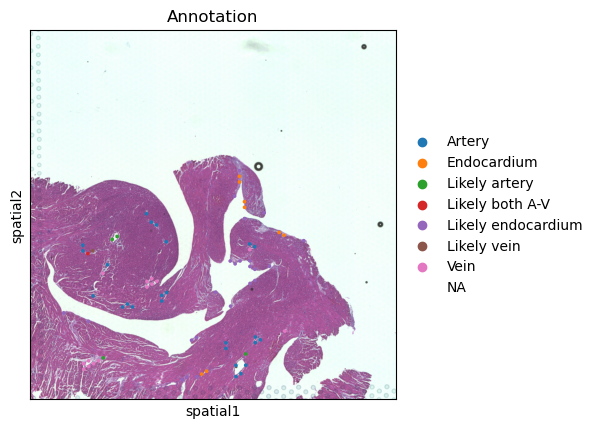

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


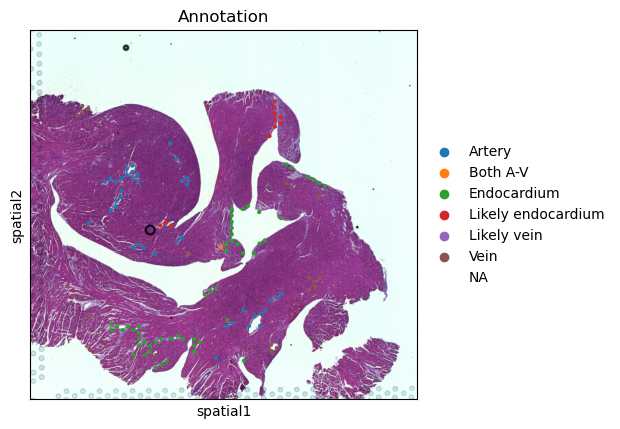

In [59]:
for samplename in ventricle_sc.obs['sample'].unique():
    sc.pl.spatial(ventricle_sc[ventricle_sc.obs['sample'] == samplename], 
                  library_id = samplename,
                  color='Annotation')

# Atrial

In [43]:
atrial_sc = sc.read_h5ad("heart_atrial/ncell7_alpha20/ncell7_alpha20/sp.h5ad")
celltypes = atrial_sc.uns['mod']['factor_names']
atrial_sc.obs[atrial_sc.uns['mod']['factor_names']] = atrial_sc.obsm['q95_cell_abundance_w_sf']
for celltype in celltypes:
    if f'{celltype}_ori' in atrial_sc.obs.columns:
        atrial_sc.obs = atrial_sc.obs.drop(f'{celltype}_ori', axis=1)
    atrial_sc.obs = atrial_sc.obs.rename({celltype: f'{celltype}_ori'}, axis=1)
    atrial_sc.obs[f'{celltype}'] = atrial_sc.obs[f'{celltype}_ori'].apply(lambda x:x if x >= 1 else 0)
# spots with at least two celltypes
atrial_sc.obs['valid_celltypes_number'] = [(x>0).sum() for x in atrial_sc.obs[celltypes].values]
atrial_sc.obs['valid_celltypes_number'].value_counts()

valid_celltypes_number
2    2976
1    1235
3     788
0     153
4     141
5      59
6      13
7       4
Name: count, dtype: int64

In [47]:
nmf_atrial_sc = atrial_sc[atrial_sc.obs['valid_celltypes_number'] >= 2].copy()
atrial_res_dict, nmf_atrial_sc = run_colocation(
    nmf_atrial_sc,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': [30],
      'sample_name_col': 'sample',
      'n_restarts': 3,
    },
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.0000001}},
    export_args={'path': f'heart_atrial/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_30combinations_3981locations_16factors


/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


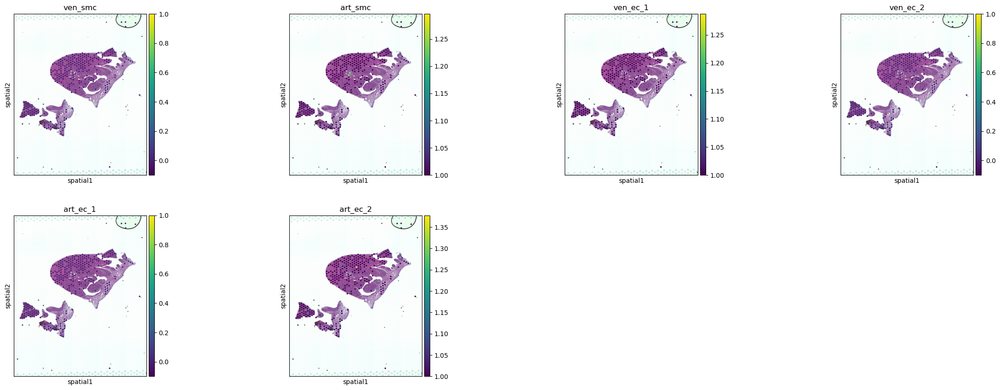

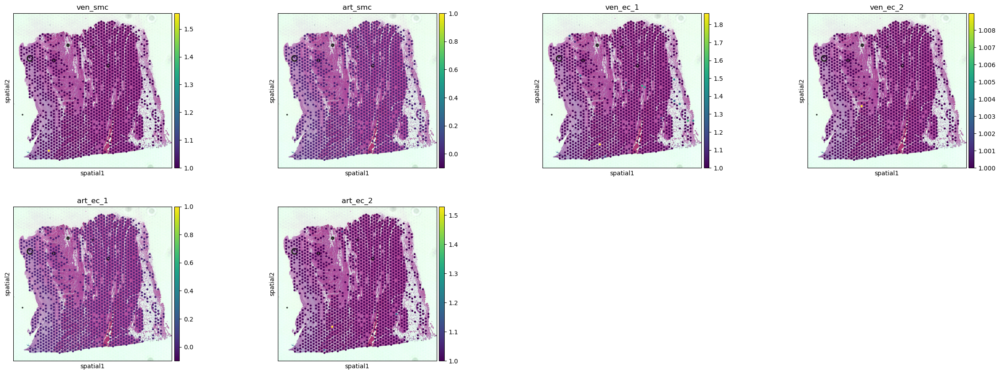

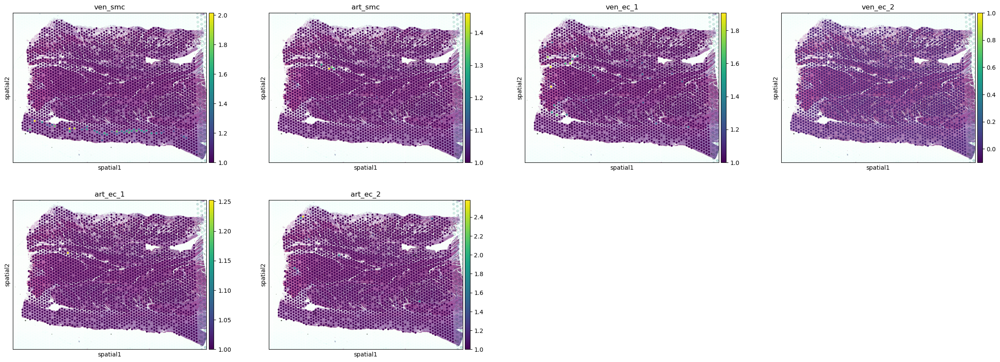

In [54]:
for samplename in nmf_atrial_sc.obs['sample'].unique():
    sc.pl.spatial(nmf_atrial_sc[nmf_atrial_sc.obs['sample'] == samplename],
                  color=['ven_smc', 'art_smc', 'ven_ec_1', 'ven_ec_2', 'art_ec_1', 'art_ec_2'],
                  library_id=samplename, vmin=1, ncols=4)

In [60]:
# add annotation
manual_anno_dir = Path("/lustre/scratch126/cellgen/team205/sl37/vasculature/heart/heart_imagine_manual_annotations")
atrial_samples = atrial_sc.obs['sample'].unique()
atrial_samplename_annotation_path_dic = {}
for samplename in atrial_samples:
    if os.path.exists(manual_anno_dir/f'Annotation_{samplename}.csv'):
        atrial_samplename_annotation_path_dic[samplename] = manual_anno_dir/f'Annotation_{samplename}.csv'
        
merged_annotation_df = pd.DataFrame()
for samplename in atrial_samplename_annotation_path_dic.keys():
    annotation_df = pd.read_csv(atrial_samplename_annotation_path_dic.get(samplename), index_col=0)
    annotation_df['cellbarcodes'] = [f'{samplename}_{x}' for x in annotation_df.index]
    merged_annotation_df = pd.concat([merged_annotation_df, annotation_df.set_index('cellbarcodes')], axis=0)
    
atrial_sc.obs = atrial_sc.obs.join(merged_annotation_df)
atrial_sc.obs['Annotation'] = atrial_sc.obs['Annotation'].astype('category')

atrial_sc.obs['Annotation'].value_counts()

Annotation
Endocardium                         348
Subendocardial fibrous              235
Adipose tissue                      214
Poorly preserved endocardium        162
Subendocardial_SmoothMuscleLayer    103
Vein                                 61
Artery                               41
Likely endocardial layer             40
Likely vein                           9
Potentialy endocardium                8
Blood vessel                          6
Both A-V                              3
Likely artery                         3
Could be lymphatic                    2
Potentially lymphatic                 2
Name: count, dtype: int64

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


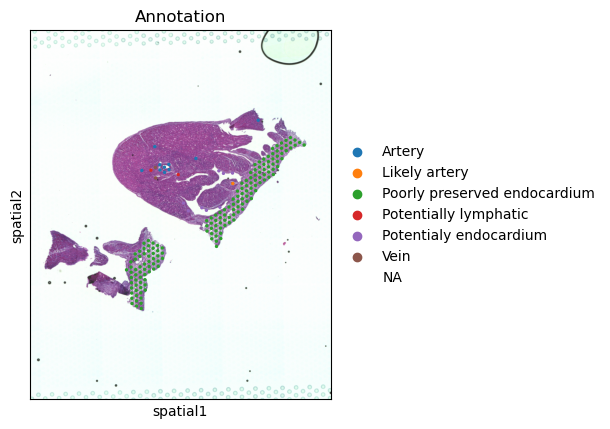

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


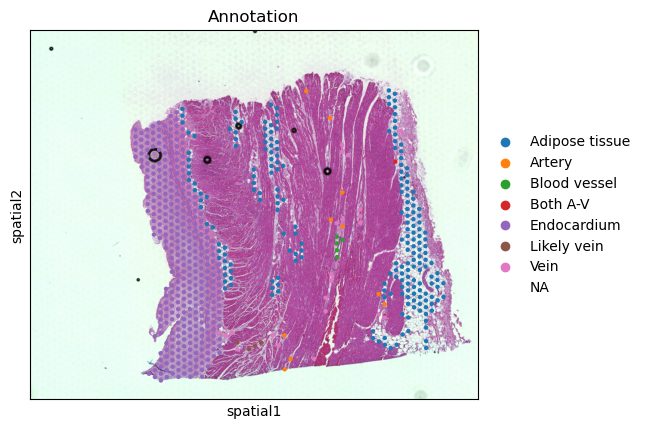

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


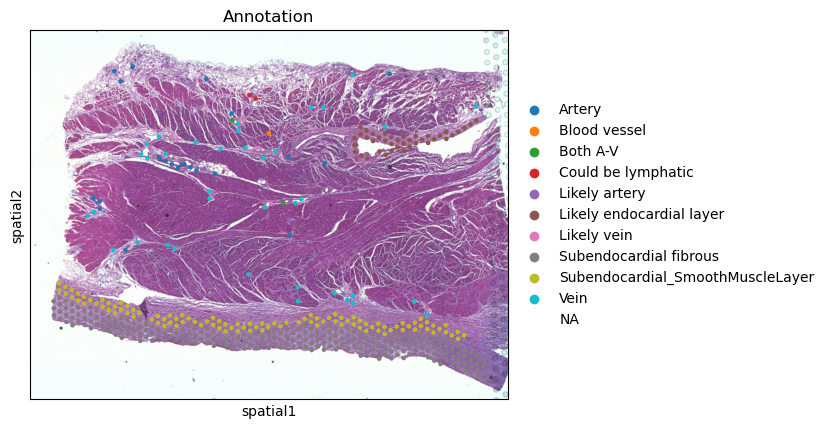

In [61]:
for samplename in atrial_sc.obs['sample'].unique():
    sc.pl.spatial(atrial_sc[atrial_sc.obs['sample'] == samplename], 
                  library_id = samplename,
                  color='Annotation')

# heart all

In [11]:
heart_sc = sc.read_h5ad("heart_ref/ncell7_alpha20/sp.h5ad")
celltypes = heart_sc.uns['mod']['factor_names']
heart_sc.obs[heart_sc.uns['mod']['factor_names']] = heart_sc.obsm['q05_cell_abundance_w_sf']

In [60]:
for celltype in celltypes:
    if f'{celltype}_ori' in heart_sc.obs.columns:
        heart_sc.obs = heart_sc.obs.drop(f'{celltype}_ori', axis=1)
    heart_sc.obs = heart_sc.obs.rename({celltype: f'{celltype}_ori'}, axis=1)
    heart_sc.obs[f'{celltype}'] = heart_sc.obs[f'{celltype}_ori'].apply(lambda x:x if x >= 1.5 else 0)
# spots with at least two celltypes
heart_sc.obs['valid_celltypes_number'] = [(x>0).sum() for x in heart_sc.obs[celltypes].values]
nmf_heart_sc = heart_sc[heart_sc.obs['valid_celltypes_number'] >= 2].copy()

# not care about CM and epithelial cells
nmf_heart_sc.obsm['q05_cell_abundance_w_sf'] = nmf_heart_sc.obsm['q05_cell_abundance_w_sf'].drop("q05cell_abundance_w_sf_CM", axis=1)
nmf_heart_sc.obsm['q05_cell_abundance_w_sf'] = nmf_heart_sc.obsm['q05_cell_abundance_w_sf'].drop("q05cell_abundance_w_sf_Epithelial cells", axis=1)
nmf_heart_sc.uns['mod']['factor_names'] = [x.replace('q05cell_abundance_w_sf_', '') for x in nmf_heart_sc.obsm['q05_cell_abundance_w_sf'].columns]

heart_res_dict, nmf_heart_sc = run_colocation(
    nmf_heart_sc,
    model_name='CoLocatedGroupsSklearnNMF',
    train_args={
      'n_fact': [6, 7, 8, 9, 10],
      'sample_name_col': 'sample',
      'n_restarts': 3,
    },
    model_kwargs={'alpha': 0.01, 'init': 'random', "nmf_kwd_args": {"tol": 0.0000001}},
    export_args={'path': f'heart_ref/CoLocatedComb/'}
)

### Analysis name: CoLocatedGroupsSklearnNMF_6combinations_1158locations_13factors
### Analysis name: CoLocatedGroupsSklearnNMF_7combinations_1158locations_13factors
### Analysis name: CoLocatedGroupsSklearnNMF_8combinations_1158locations_13factors
### Analysis name: CoLocatedGroupsSklearnNMF_9combinations_1158locations_13factors
### Analysis name: CoLocatedGroupsSklearnNMF_10combinations_1158locations_13factors


/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


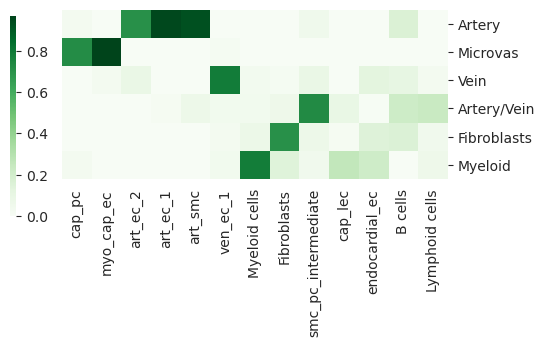

In [113]:
celltype_loadings_df = pd.read_csv("heart_ref/CoLocatedComb/CoLocatedGroupsSklearnNMF_1158locations_13factors/cell_type_fractions_mean/n_fact7.csv", 
                                           index_col=0)

plot_celltype_loadings_df = celltype_loadings_df.drop("mean_cell_type_factorsfact_1", axis=1).rename({
    'mean_cell_type_factorsfact_6': 'Artery',
    'mean_cell_type_factorsfact_2': 'Microvas',
    'mean_cell_type_factorsfact_4': 'Vein',
    'mean_cell_type_factorsfact_0': 'Artery/Vein',
    'mean_cell_type_factorsfact_3': 'Fibroblasts',
    'mean_cell_type_factorsfact_5': 'Myeloid'
}, axis=1)

sns.set_style("darkgrid")
g = sns.clustermap(plot_celltype_loadings_df.T, cmap="Greens", 
                   figsize=(6, 4), colors_ratio=0.03, 
                   cbar_pos=(0.1, 0.34, 0.01, 0.5))
g.ax_row_dendrogram.set_visible(False)
g.ax_col_dendrogram.set_visible(False)
g.tick_params()
g.savefig("heart_ref/NMF_heatmap.pdf")
g.savefig("heart_ref/NMF_heatmap.png")

# annotation

In [12]:
manual_anno_dir = Path("/lustre/scratch126/cellgen/team205/sl37/vasculature/heart/heart_imagine_manual_annotations")
heart_samples = heart_sc.obs['sample'].unique()
heart_samplename_annotation_path_dic = {}
for samplename in heart_samples:
    if os.path.exists(manual_anno_dir/f'Annotation_{samplename}.csv'):
        heart_samplename_annotation_path_dic[samplename] = manual_anno_dir/f'Annotation_{samplename}.csv'
        
merged_annotation_df = pd.DataFrame()
for samplename in heart_samplename_annotation_path_dic.keys():
    annotation_df = pd.read_csv(heart_samplename_annotation_path_dic.get(samplename), index_col=0)
    annotation_df['cellbarcodes'] = [f'{samplename}_{x}' for x in annotation_df.index]
    merged_annotation_df = pd.concat([merged_annotation_df, annotation_df.set_index('cellbarcodes')], axis=0)
    
heart_sc.obs = heart_sc.obs.join(merged_annotation_df)
heart_sc.obs['Annotation'] = heart_sc.obs['Annotation'].astype('category')

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


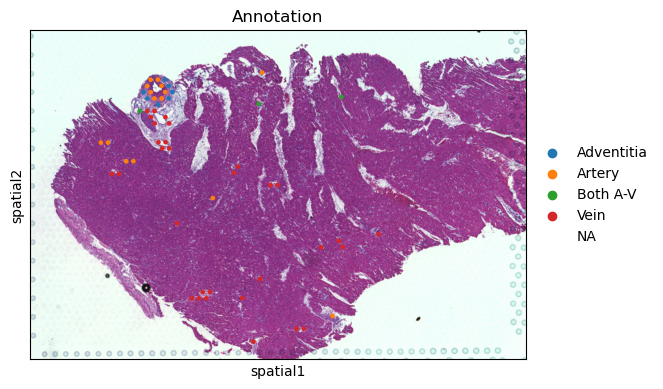

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


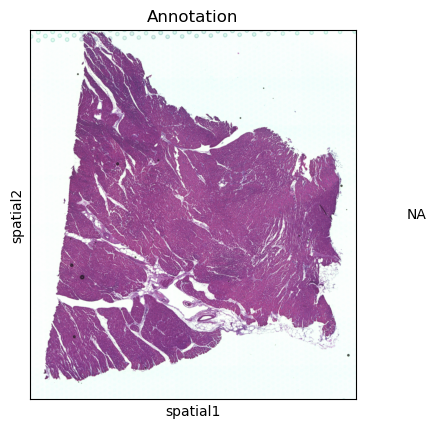

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


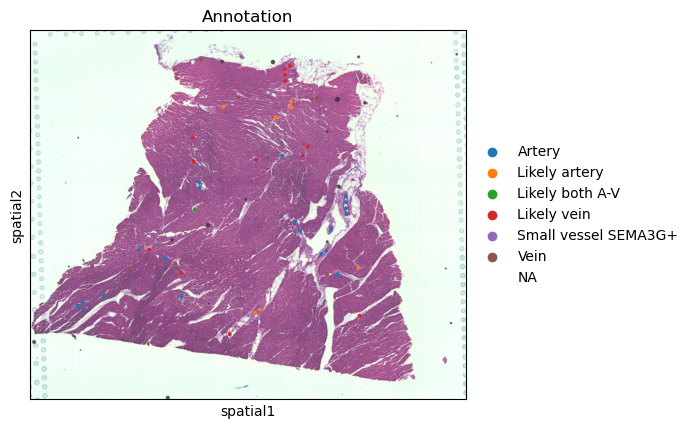

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


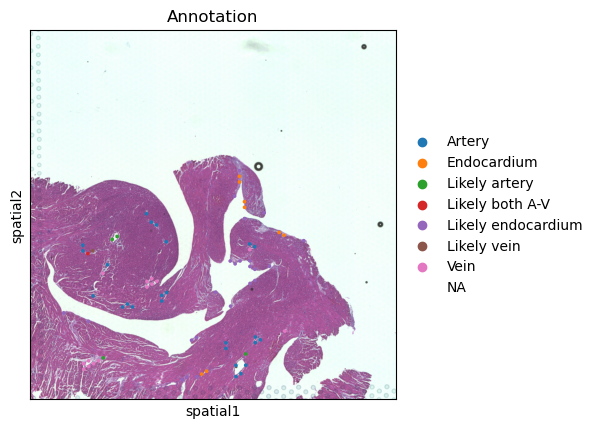

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


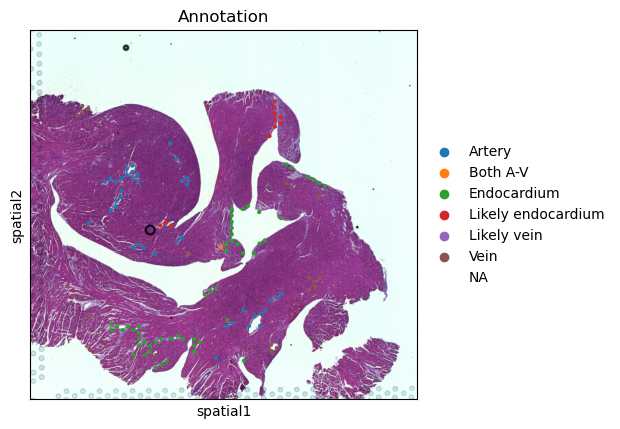

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


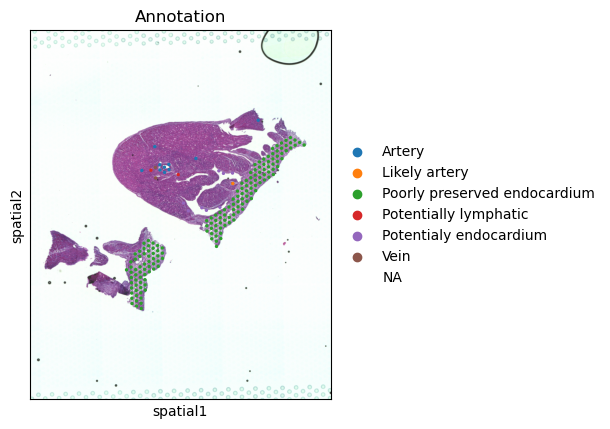

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


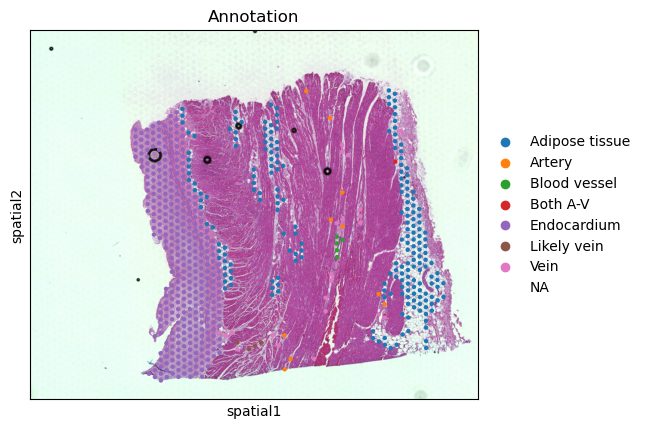

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/plotting/_utils.py:471: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


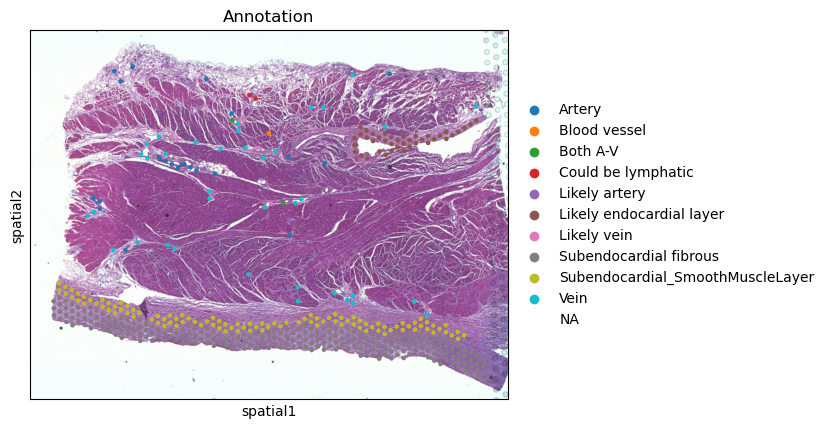

In [4]:
for samplename in heart_sc.obs['sample'].unique():
    sc.pl.spatial(heart_sc[heart_sc.obs['sample'] == samplename],
                  library_id = samplename,
                  color=['Annotation'])

In [13]:
heart_sc.uns['spatial'].keys()

dict_keys(['RTR02-HHH1-LA', 'RTR02-HHH2-LV-1-1', 'RTR02-HHH2-LV-1-2', 'RTR02-HHH2-LV-2-1', 'RTR02-HHH2-LV-2-2', 'RTR02-HHH2-RA', 'RTR02-HHH4-LA', 'RTR02-HHH4-LV'])

In [14]:
from cell2location.utils import select_slide
import squidpy as sq

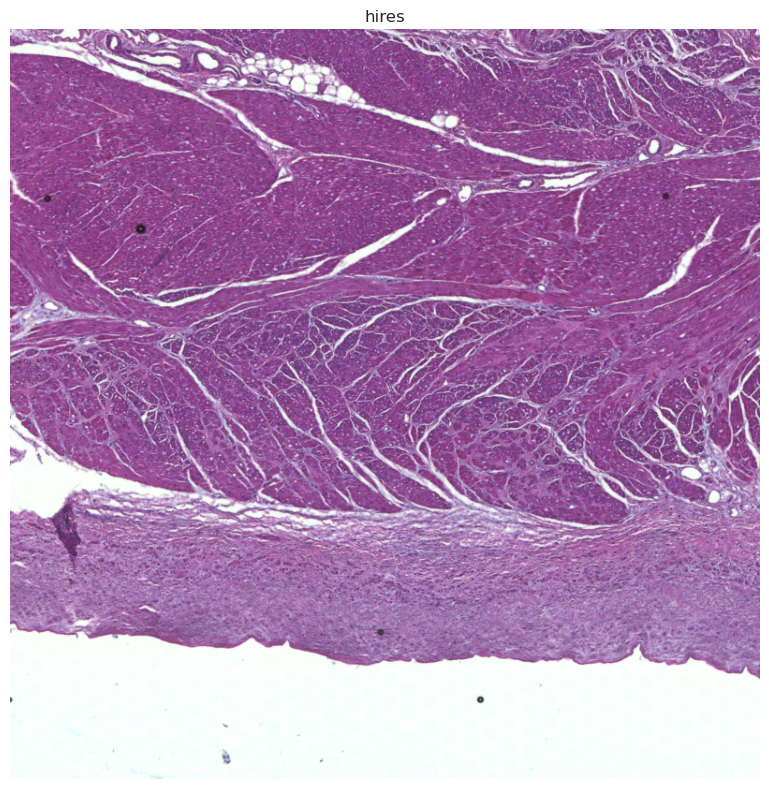

In [139]:
library_id = "RTR02-HHH1-LA"
slide = select_slide(heart_sc, s=library_id)
img = sq.im.ImageContainer.from_adata(slide)
# img.show()
crop_conor = img.crop_center(1200, 1000, radius=400)
crop_conor.show()

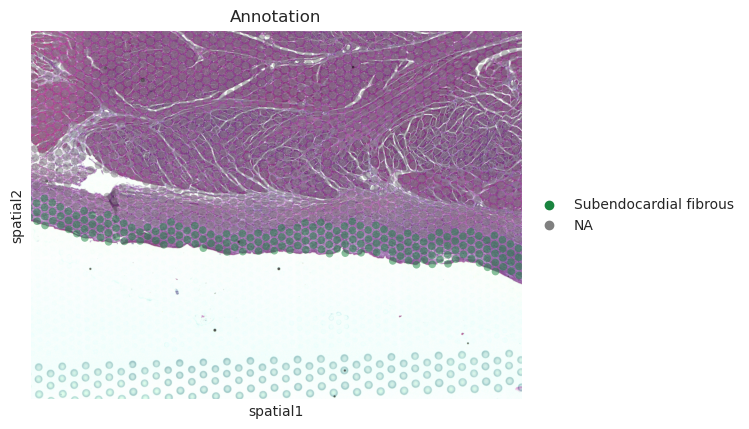

In [179]:
sc.pl.spatial(
    slide,
    img_key="hires",
    color="Annotation",
    groups=["Subendocardial fibrous"],
    crop_coord=[2000, 8000, 4000, 8500],
    alpha=0.5,
    size=1.3,
    palette="Greens",
    na_color='gray',
    save="endocardial_fib.png"
)


In [15]:
heart_sc.obs['Annotation'].value_counts()

Annotation
Endocardium                         411
Subendocardial fibrous              235
Adipose tissue                      214
Poorly preserved endocardium        162
Artery                              141
Vein                                136
Subendocardial_SmoothMuscleLayer    103
Likely endocardial layer             40
Likely endocardium                   34
Likely vein                          26
Likely artery                        14
Potentialy endocardium                8
Adventitia                            7
Both A-V                              7
Blood vessel                          6
Likely both A-V                       2
Could be lymphatic                    2
Potentially lymphatic                 2
Small vessel SEMA3G+                  1
Name: count, dtype: int64

In [53]:
anno_dic = {"Endocardium": "Endocardium",
"Subendocardial fibrous": "Endocardium",
"Adipose tissue": "Adipose tissue",
"Artery": "Artery",
"Vein": "Vein",
"Subendocardial_SmoothMuscleLayer": "Endocardium",
"Likely endocardial layer": "Endocardium",
"Likely endocardium": "Endocardium",
"Likely vein": "Vein",
"Both A-V":"Vein",
            "Likely both A-V": "Vein",
"Likely artery": "Artery",
"Potentialy endocardium": "Endocardium",
"Adventitia": "Adventitia"}

heart_sc.obs['broad_anno'] = heart_sc.obs['Annotation'].apply(lambda x:anno_dic.get(x))
heart_sc.obs['broad_anno'] = heart_sc.obs['broad_anno'].astype('category')

In [20]:
heart_sc.uns['mod']['factor_names']

array(['B cells', 'CM', 'Epithelial cells', 'Fibroblasts',
       'Lymphoid cells', 'Myeloid cells', 'art_ec_1', 'art_ec_2',
       'art_smc', 'cap_lec', 'cap_pc', 'endocardial_ec', 'myo_cap_ec',
       'smc_pc_intermediate', 'ven_ec_1'], dtype=object)

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/tools/_utils.py:41: UserWarning: You’re trying to run this on 12490 dimensions of `.X`, if you really want this, set `use_rep='X'`.
         Falling back to preprocessing with `sc.pp.pca` and default params.
  warnings.warn(


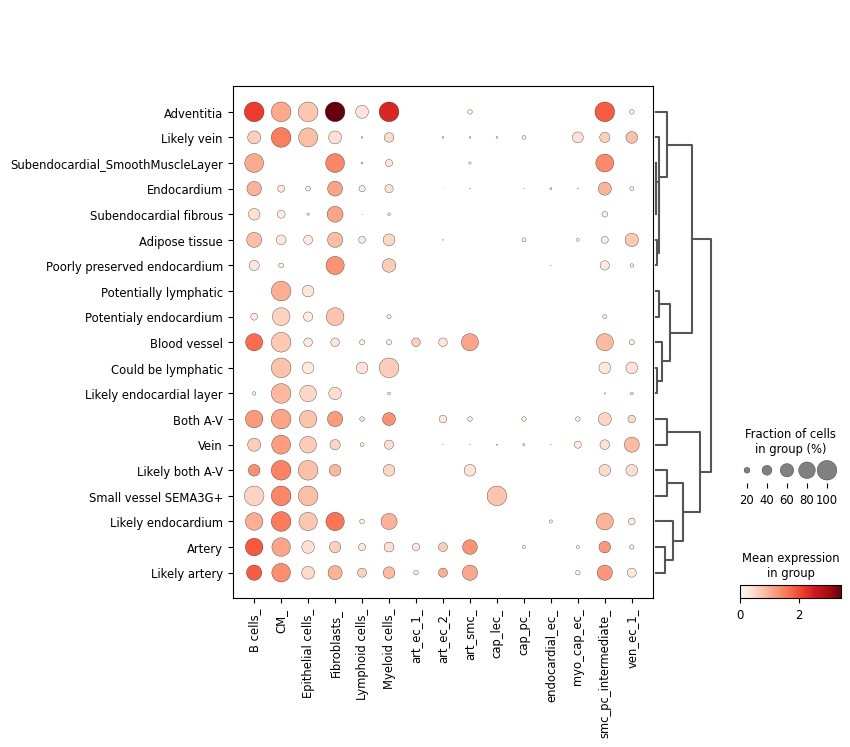

In [21]:
# celltypes = [x.replace(' ', '_') for x in heart_sc.uns['mod']['factor_names']]
celltypes = heart_sc.uns['mod']['factor_names']
celltypes_to_plot = []
for celltype in celltypes:
    heart_sc.obs[f'{celltype}_'] = heart_sc.obs[celltype].apply(lambda x:x if x > 0.5 else 0)
    celltypes_to_plot.append(f'{celltype}_')
sc.tl.dendrogram(heart_sc, 'Annotation')
sc.pl.dotplot(heart_sc, 
              celltypes_to_plot, 
              groupby='Annotation', 
              dendrogram=True,
              )

/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/scanpy/tools/_dendrogram.py:193: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = dat


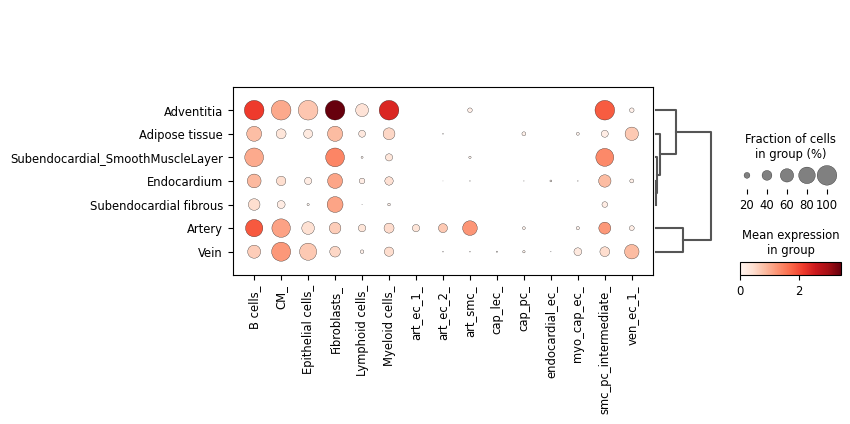

In [24]:
broad_subsetted_heart_sc = heart_sc[~heart_sc.obs['broad_anno'].isnull()]
sc.tl.dendrogram(broad_subsetted_heart_sc, 'broad_anno')
sc.pl.dotplot(broad_subsetted_heart_sc, 
              celltypes_to_plot, 
              groupby='broad_anno', 
              dendrogram=True)

In [26]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

region = "Artery"
celltype = "arterial_smc"

def get_oddsratio_for_celltype_in_region(celltype_df, celltype, region, group_label='Annotation'):
    isregion = lambda x:1 if x == region else 0
    celltype_df[f"is_{region.replace(' ', '_').replace('-', '_').replace('+', '').replace('/', '')}"] = [isregion(x) for x in celltype_df[group_label]]
    # regression
    res = smf.ols(f"is_{region.replace(' ', '_').replace('-', '_').replace('+', '').replace('/', '')} ~ {celltype}", data=celltype_df).fit()
    params = res.params
    conf = res.conf_int()
    conf['Odds Ratio'] = params
    conf.columns = ['5%', '95%', 'Odds Ratio']
    conf = np.exp(conf)
    conf['P>|t|'] = res.summary2().tables[1]['P>|t|']
    conf['t'] = res.summary2().tables[1]['P>|t|']
    return conf.loc[celltype].to_frame().T

In [100]:
heart_sc.obs = heart_sc.obs.rename({celltype: celltype.replace(" ", "_") for celltype in heart_sc.uns['mod']['factor_names']}, 
                                   axis=1)
celltypes = [x.replace(' ', '_') for x in heart_sc.uns['mod']['factor_names'] if x not in ['Epithelial cells', 'CM']]
regions = heart_sc.obs['broad_anno'].unique().categories
heart_sc.obs['Annotation_and_other'] = heart_sc.obs['broad_anno'].astype('O').fillna('Other')
heart_sc.obs['sum_celltypes'] = heart_sc.obs[celltypes].sum(axis=1)

res_df = pd.DataFrame()
for region in regions:
    region_df = pd.DataFrame()
    for celltype in celltypes:
        celltype_df = heart_sc.obs[[celltype, 'Annotation_and_other', 'sum_celltypes']].copy()
        celltype_res_df = get_oddsratio_for_celltype_in_region(celltype_df, celltype, region, 'Annotation_and_other')
        region_df = pd.concat([region_df, celltype_res_df], axis=0)
    region_df['region'] = region
    res_df = pd.concat([res_df, region_df], axis=0)
    
res_df.to_csv("heart_ref/allspots_celltype_FC.csv")

In [27]:
res_df = pd.read_csv("heart_ref/allspots_celltype_FC.csv", index_col=0)
for region in res_df['region'].unique():
    print(region)
    region_res_df = res_df[res_df['region'] == region].sort_values('Odds Ratio', ascending=False)
    region_res_df['adj_P'] = [min(x, 1) for x in region_res_df['P>|t|'].values * region_res_df.shape[0]]
    issig = lambda x:'lightseagreen' if x < 0.05 else 'lightgray'
    region_res_df['isSig'] = [issig(x) for x in region_res_df['adj_P']]
    edgecolor = lambda x:'seagreen' if x < 0.05 else 'gray'
    region_res_df['edgecolor'] = [edgecolor(x) for x in region_res_df['adj_P']]
    _ = plt.plot([-1, region_res_df.shape[0]], [1, 1], color='gray')
    _ = plt.errorbar(x=region_res_df.index, 
                     y=region_res_df['Odds Ratio'], 
                     yerr=[(region_res_df['Odds Ratio'] - region_res_df['5%']), 
                           (region_res_df['95%'] - region_res_df['Odds Ratio'])],
                     elinewidth=2,
                     capthick=10,
                     errorevery=1, 
                     alpha=0.5,
                     color='gray',
                     fmt="o")
    _ = plt.bar(x=region_res_df.index, 
                    height=region_res_df['Odds Ratio'],
                    color=region_res_df['isSig'],
                edgecolor=region_res_df['edgecolor'])

    _ = plt.ylim([region_res_df['5%'].min() - 0.01,
                  region_res_df['95%'].max() + 0.01])


    legend_elements = [Patch(facecolor='lightseagreen', edgecolor='seagreen',
                             label='Significant'),
                       Patch(facecolor='lightgray', edgecolor='gray',
                             label='Insignificant')]
    _ = plt.legend(handles=legend_elements, loc='upper right')

    _ = plt.xticks(rotation=90)
    _ = plt.ylabel("Odds Ratio")
    _ = plt.title(region)
    plt.tight_layout()
    # plt.show()
    plt.savefig(f"heart_ref/enrichment_figures/{region.replace(' ', '_')}_celltypesOR.pdf")
    plt.savefig(f"heart_ref/enrichment_figures/{region.replace(' ', '_')}_celltypesOR.png")
    plt.close()

Adipose tissue
Adventitia
Artery
Endocardium
Subendocardial fibrous
Subendocardial_SmoothMuscleLayer
Vein


Adipose tissue


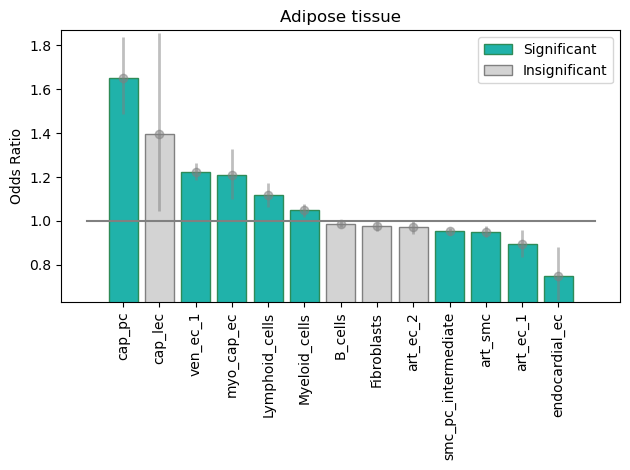

Adventitia


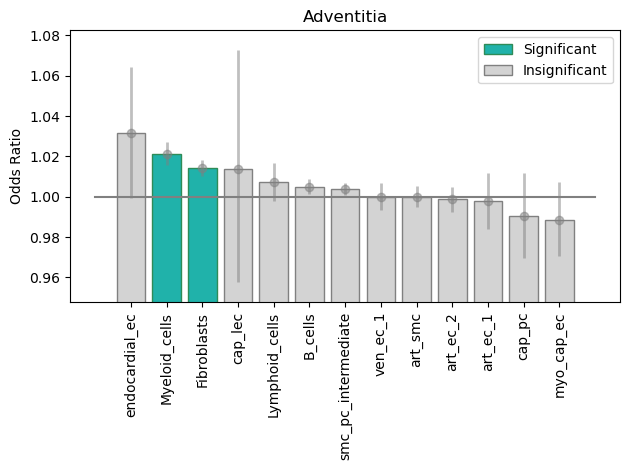

Artery


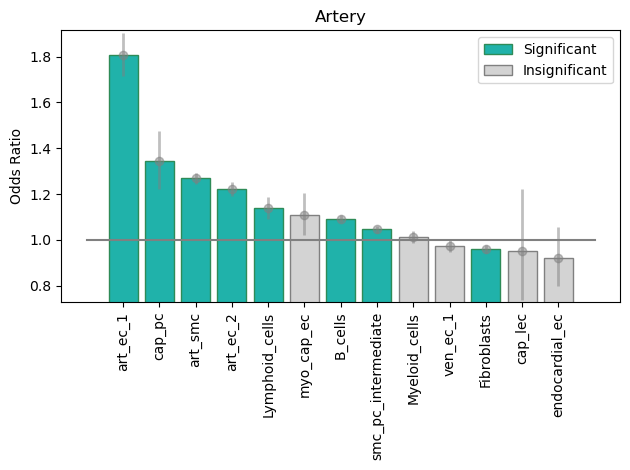

Endocardium


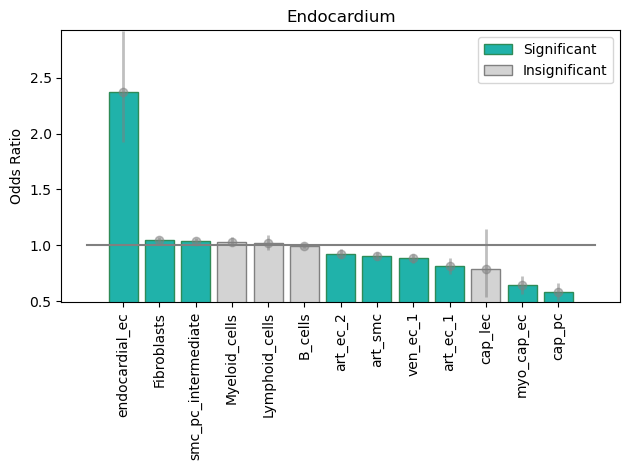

Subendocardial fibrous


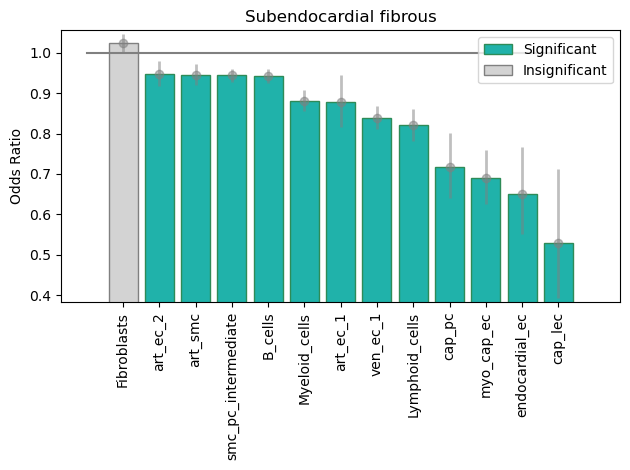

Subendocardial_SmoothMuscleLayer


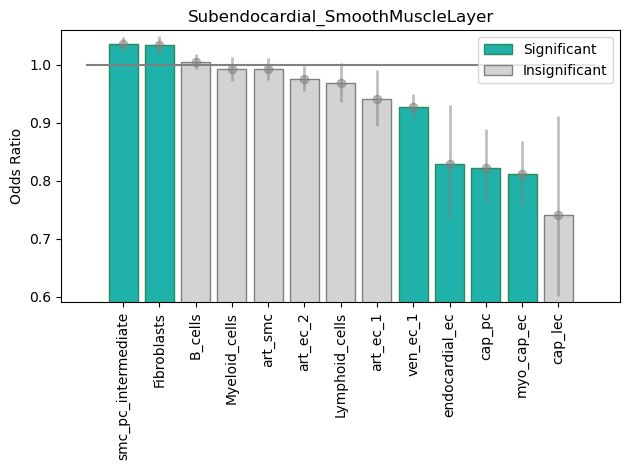

Vein


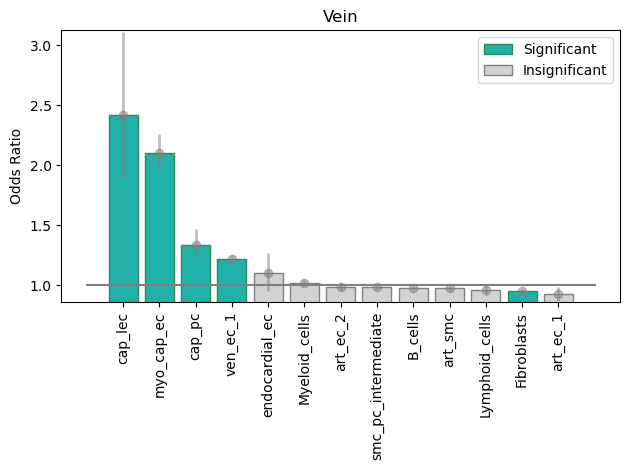

In [29]:
broad_subsetted_heart_sc.obs = broad_subsetted_heart_sc.obs.rename({celltype: celltype.replace(" ", "_") for celltype in broad_subsetted_heart_sc.uns['mod']['factor_names']}, 
                                   axis=1)
celltypes = [x.replace(' ', '_') for x in broad_subsetted_heart_sc.uns['mod']['factor_names'] if x not in ['Epithelial cells', 'CM']]
regions = broad_subsetted_heart_sc.obs['broad_anno'].unique().categories
broad_subsetted_heart_sc.obs['Annotation_and_other'] = broad_subsetted_heart_sc.obs['broad_anno'].astype('O').fillna('Other')
broad_subsetted_heart_sc.obs['sum_celltypes'] = broad_subsetted_heart_sc.obs[celltypes].sum(axis=1)

res_df = pd.DataFrame()
for region in regions:
    region_df = pd.DataFrame()
    for celltype in celltypes:
        celltype_df = broad_subsetted_heart_sc.obs[[celltype, 'Annotation_and_other', 'sum_celltypes']].copy()
        celltype_res_df = get_oddsratio_for_celltype_in_region(celltype_df, celltype, region, 'Annotation_and_other')
        region_df = pd.concat([region_df, celltype_res_df], axis=0)
    region_df['region'] = region
    res_df = pd.concat([res_df, region_df], axis=0)
    

for region in res_df['region'].unique():
    print(region)
    region_res_df = res_df[res_df['region'] == region].sort_values('Odds Ratio', ascending=False)
    region_res_df['adj_P'] = [min(x, 1) for x in region_res_df['P>|t|'].values * region_res_df.shape[0]]
    issig = lambda x:'lightseagreen' if x < 0.05 else 'lightgray'
    region_res_df['isSig'] = [issig(x) for x in region_res_df['adj_P']]
    edgecolor = lambda x:'seagreen' if x < 0.05 else 'gray'
    region_res_df['edgecolor'] = [edgecolor(x) for x in region_res_df['adj_P']]
    _ = plt.plot([-1, region_res_df.shape[0]], [1, 1], color='gray')
    _ = plt.errorbar(x=region_res_df.index, 
                     y=region_res_df['Odds Ratio'], 
                     yerr=[(region_res_df['Odds Ratio'] - region_res_df['5%']), 
                           (region_res_df['95%'] - region_res_df['Odds Ratio'])],
                     elinewidth=2,
                     capthick=10,
                     errorevery=1, 
                     alpha=0.5,
                     color='gray',
                     fmt="o")
    _ = plt.bar(x=region_res_df.index, 
                    height=region_res_df['Odds Ratio'],
                    color=region_res_df['isSig'],
                edgecolor=region_res_df['edgecolor'])

    _ = plt.ylim([region_res_df['5%'].min() - 0.01,
                  region_res_df['95%'].max() + 0.01])


    legend_elements = [Patch(facecolor='lightseagreen', edgecolor='seagreen',
                             label='Significant'),
                       Patch(facecolor='lightgray', edgecolor='gray',
                             label='Insignificant')]
    _ = plt.legend(handles=legend_elements, loc='upper right')

    _ = plt.xticks(rotation=90)
    _ = plt.ylabel("Odds Ratio")
    _ = plt.title(region)
    plt.tight_layout()
    plt.show()
    plt.close()

Adipose tissue


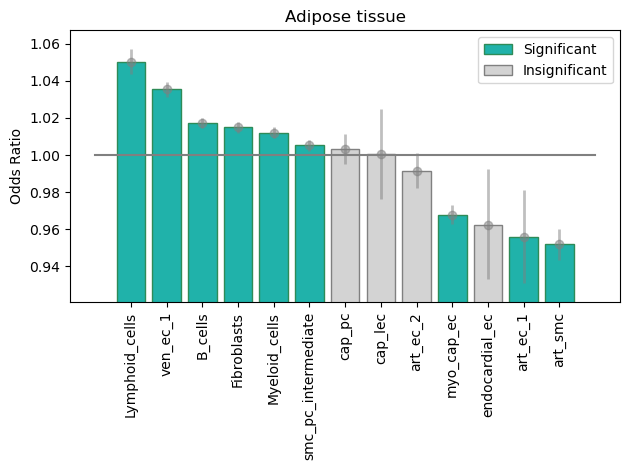

Adventitia


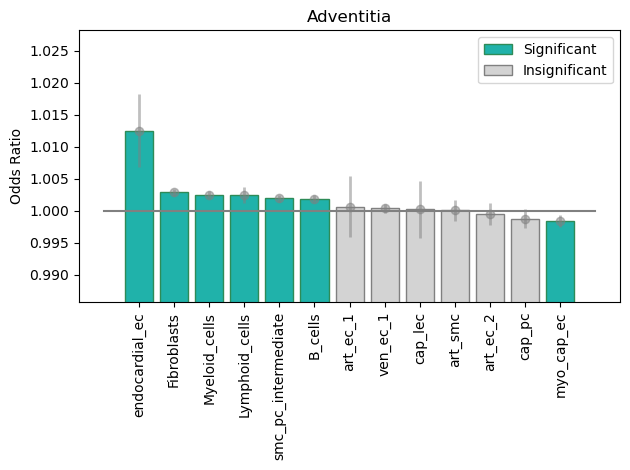

Artery


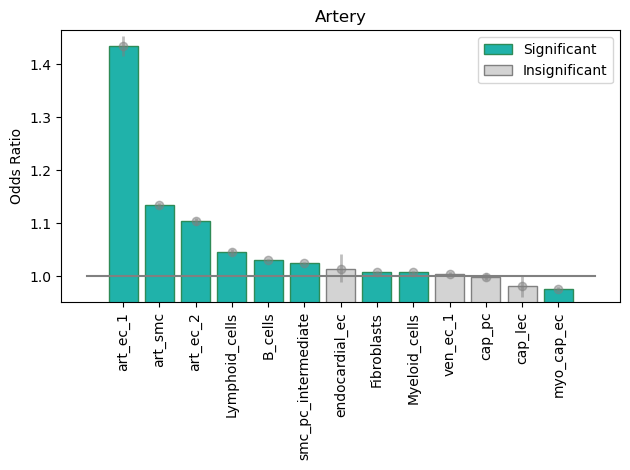

Endocardium


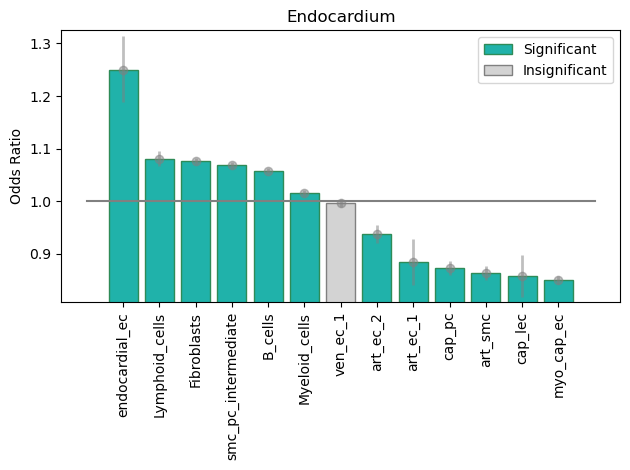

Vein


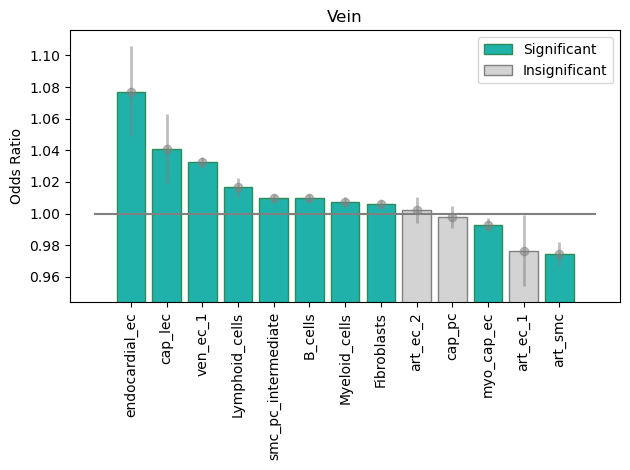

In [44]:
heart_sc.obs = heart_sc.obs.rename({celltype: celltype.replace(" ", "_") for celltype in heart_sc.uns['mod']['factor_names']}, 
                                   axis=1)
celltypes = [x.replace(' ', '_') for x in heart_sc.uns['mod']['factor_names'] if x not in ['Epithelial cells', 'CM']]
regions = heart_sc.obs['broad_anno'].unique().categories
heart_sc.obs['Annotation_and_other'] = heart_sc.obs['broad_anno'].astype('O').fillna('Other')
heart_sc.obs['sum_celltypes'] = heart_sc.obs[celltypes].sum(axis=1)

res_df = pd.DataFrame()
for region in regions:
    region_df = pd.DataFrame()
    region_heart_sc = heart_sc[heart_sc.obs['Annotation_and_other'].isin(['Other', region])]
    for celltype in celltypes:
        celltype_df = region_heart_sc.obs[[celltype, 'Annotation_and_other', 'sum_celltypes']].copy()
        celltype_res_df = get_oddsratio_for_celltype_in_region(celltype_df, celltype, region, 'Annotation_and_other')
        region_df = pd.concat([region_df, celltype_res_df], axis=0)
    region_df['region'] = region
    res_df = pd.concat([res_df, region_df], axis=0)
    

for region in res_df['region'].unique():
    print(region)
    region_res_df = res_df[res_df['region'] == region].sort_values('Odds Ratio', ascending=False)
    region_res_df['adj_P'] = [min(x, 1) for x in region_res_df['P>|t|'].values * region_res_df.shape[0]]
    issig = lambda x:'lightseagreen' if x < 0.05 else 'lightgray'
    region_res_df['isSig'] = [issig(x) for x in region_res_df['adj_P']]
    edgecolor = lambda x:'seagreen' if x < 0.05 else 'gray'
    region_res_df['edgecolor'] = [edgecolor(x) for x in region_res_df['adj_P']]
    _ = plt.plot([-1, region_res_df.shape[0]], [1, 1], color='gray')
    _ = plt.errorbar(x=region_res_df.index, 
                     y=region_res_df['Odds Ratio'], 
                     yerr=[(region_res_df['Odds Ratio'] - region_res_df['5%']), 
                           (region_res_df['95%'] - region_res_df['Odds Ratio'])],
                     elinewidth=2,
                     capthick=10,
                     errorevery=1, 
                     alpha=0.5,
                     color='gray',
                     fmt="o")
    _ = plt.bar(x=region_res_df.index, 
                    height=region_res_df['Odds Ratio'],
                    color=region_res_df['isSig'],
                edgecolor=region_res_df['edgecolor'])

    _ = plt.ylim([region_res_df['5%'].min() - 0.01,
                  region_res_df['95%'].max() + 0.01])


    legend_elements = [Patch(facecolor='lightseagreen', edgecolor='seagreen',
                             label='Significant'),
                       Patch(facecolor='lightgray', edgecolor='gray',
                             label='Insignificant')]
    _ = plt.legend(handles=legend_elements, loc='upper right')

    _ = plt.xticks(rotation=90)
    _ = plt.ylabel("Odds Ratio")
    _ = plt.title(region)
    plt.tight_layout()
    plt.show()
    plt.close()

In [42]:
for celltype in celltypes:
    print(celltype, heart_sc.obs[heart_sc.obs[celltype]>1].shape[0])

B_cells 1330
Fibroblasts 1715
Lymphoid_cells 286
Myeloid_cells 1180
art_ec_1 34
art_ec_2 147
art_smc 170
cap_lec 18
cap_pc 217
endocardial_ec 12
myo_cap_ec 1144
smc_pc_intermediate 755
ven_ec_1 594


/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/statsmodels/stats/stattools.py:50: RuntimeWarning: invalid value encountered in scalar divide
  dw = np.sum(diff_resids**2, axis=axis) / np.sum(resids**2, axis=axis)
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1783: RuntimeWarning: invalid value encountered in scalar divide
  return 1 - self.ssr/self.centered_tss
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:958: RuntimeWarning: divide by zero encountered in log
  llf = -nobs2*np.log(2*np.pi) - nobs2*np.log(ssr / nobs) - nobs2
/lustre/scratch126/cellgen/team205/sl37/conda_envs/cell2loc_env/lib/python3.12/site-packages/statsmodels/regression/linear_model.py:1872: RuntimeWarning: invalid value encountered in scalar divide
  return self.mse_model/self.mse_resid
/lustre/scratch

Adipose tissue


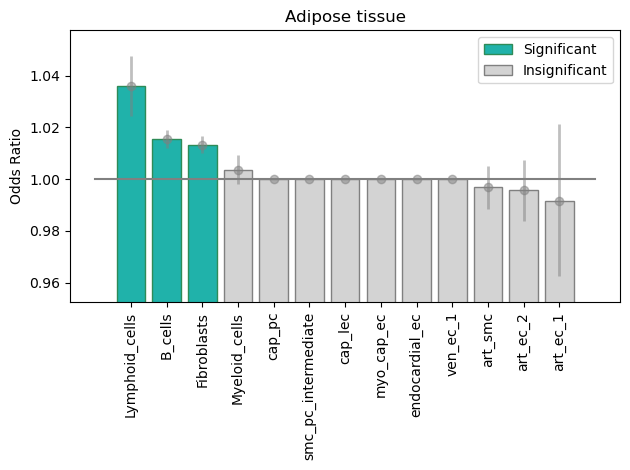

Adventitia


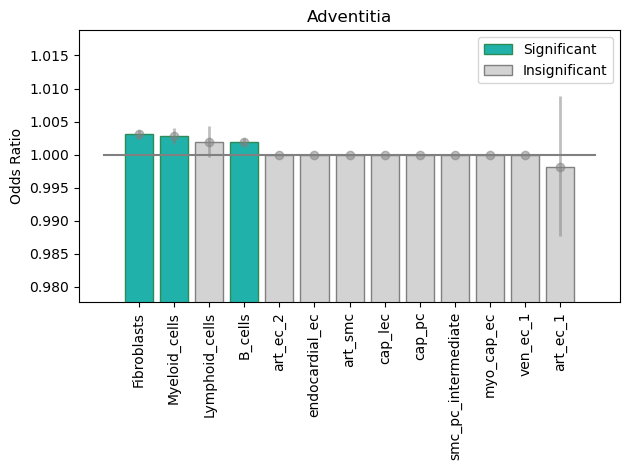

Artery


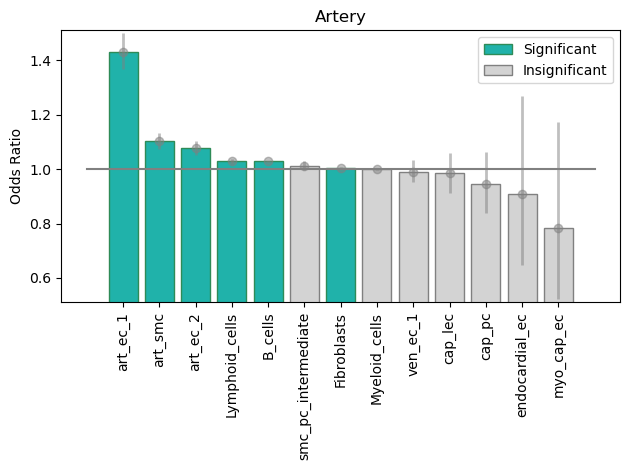

Blood vessel


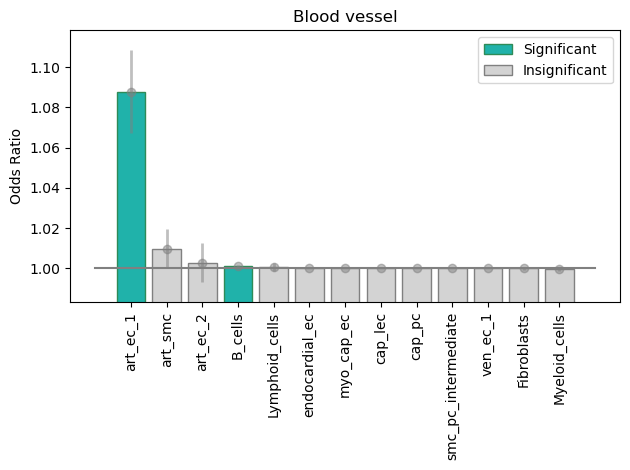

Both A-V


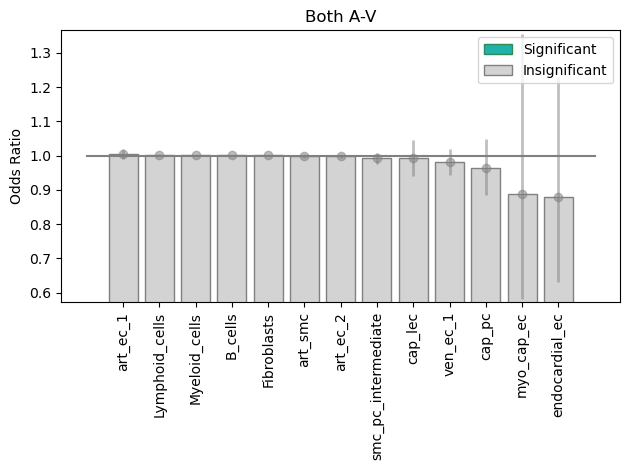

Could be lymphatic


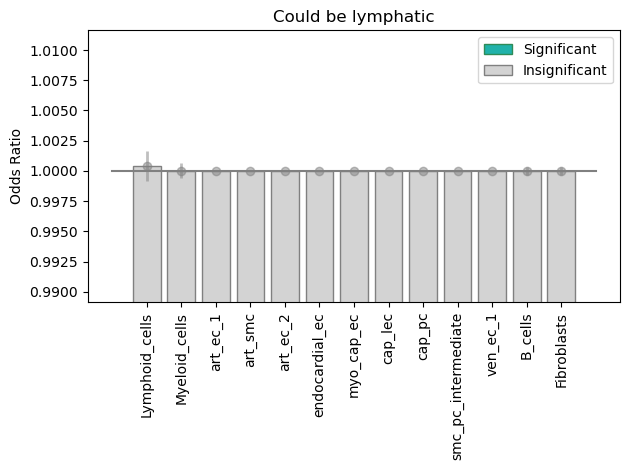

Endocardium


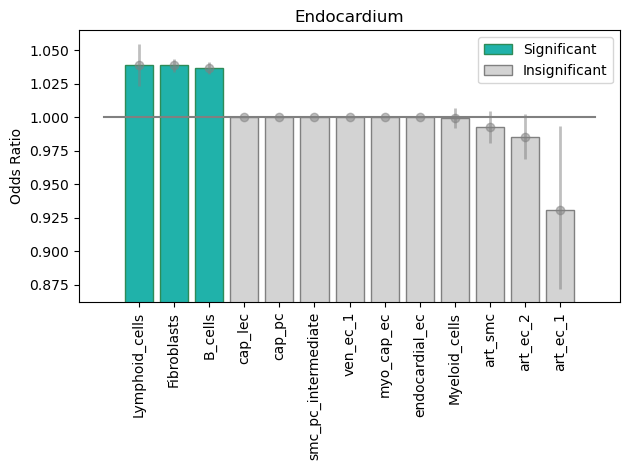

Likely artery


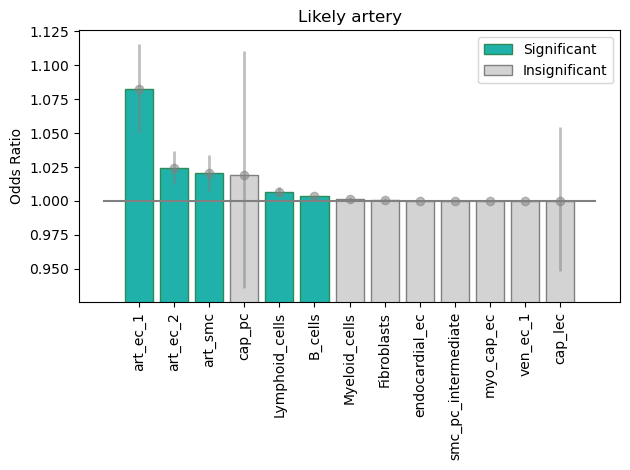

Likely both A-V


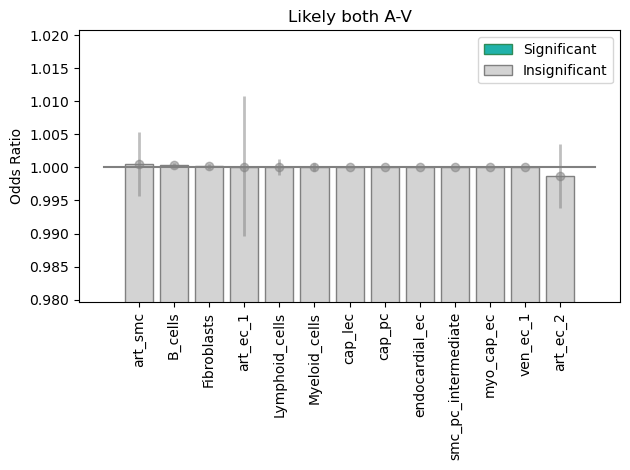

Likely endocardial layer


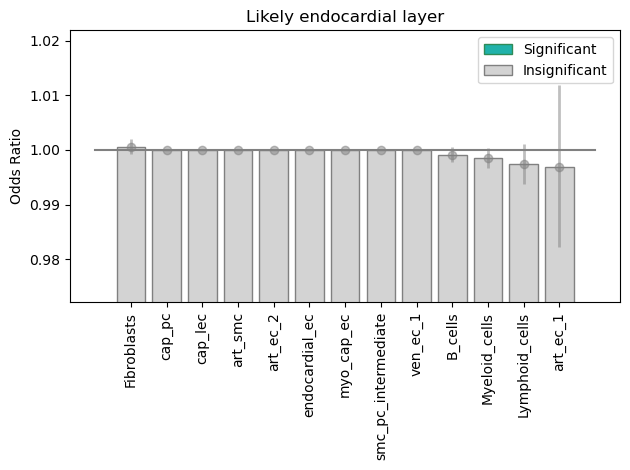

Likely endocardium


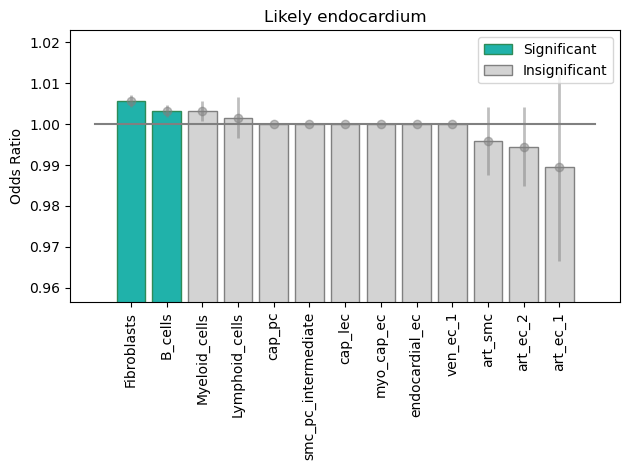

Likely vein


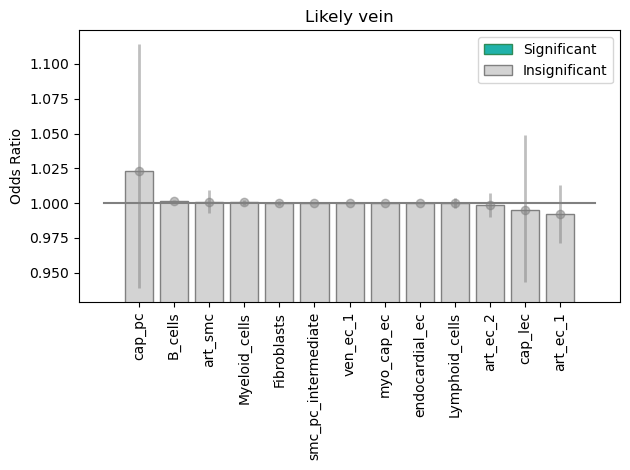

Poorly preserved endocardium


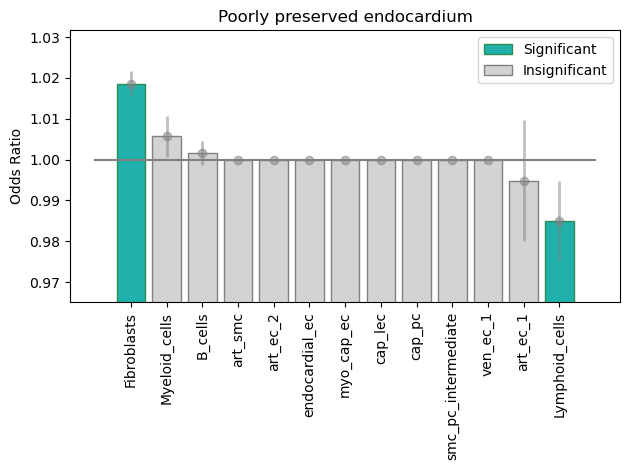

Potentially lymphatic


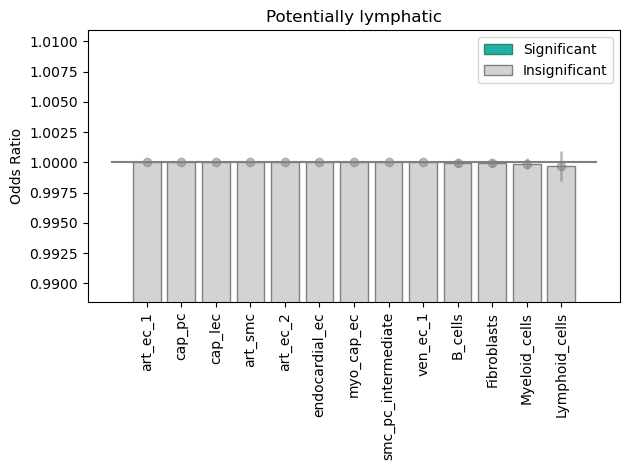

Potentialy endocardium


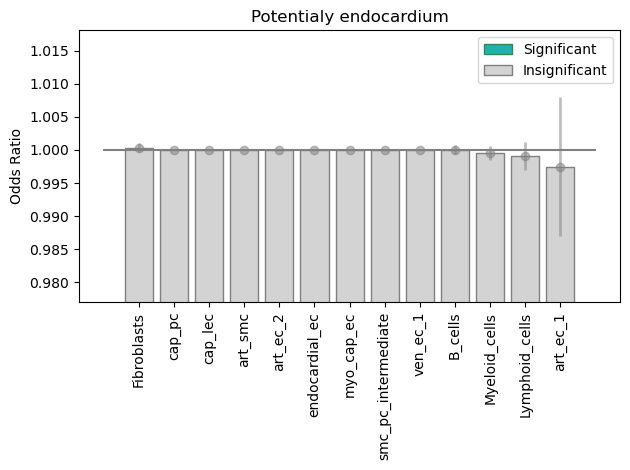

Small vessel SEMA3G+


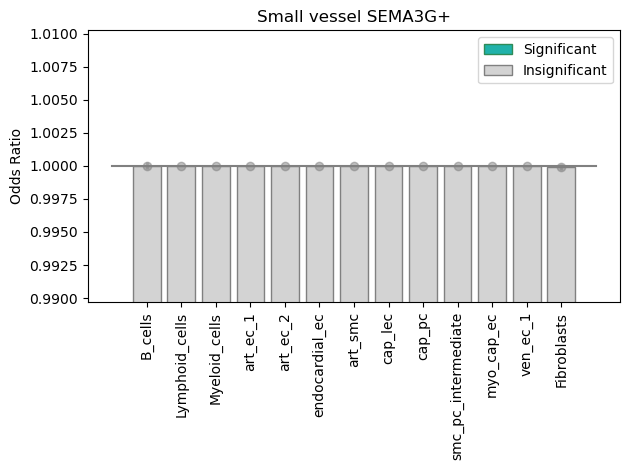

Subendocardial fibrous


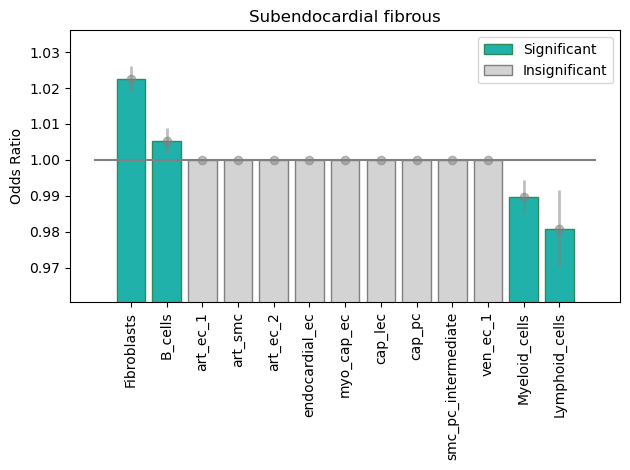

Subendocardial_SmoothMuscleLayer


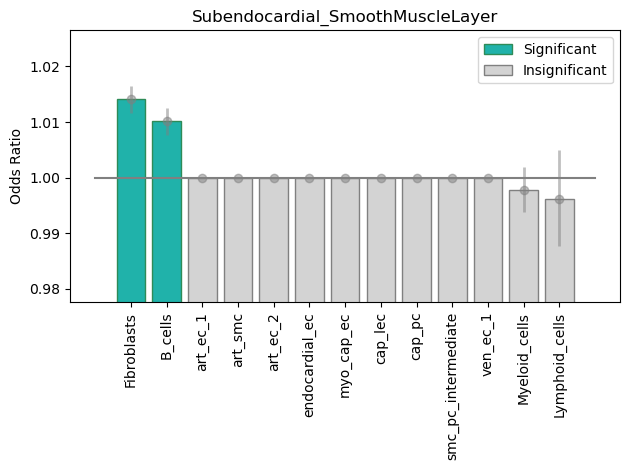

Vein


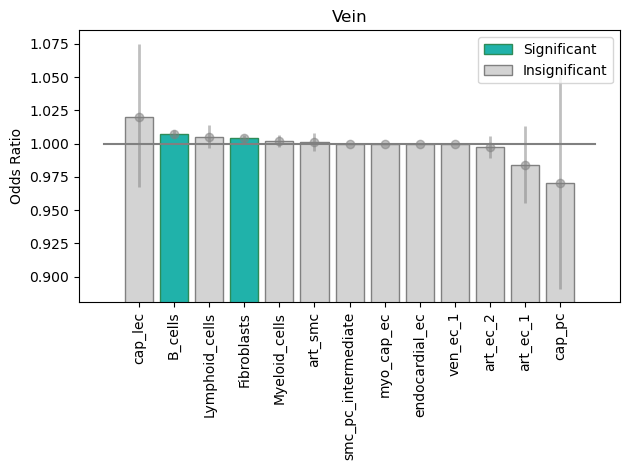

In [58]:
heart_sc.obs = heart_sc.obs.rename({celltype: celltype.replace(" ", "_") for celltype in heart_sc.uns['mod']['factor_names']}, 
                                   axis=1)
celltypes = [x.replace(' ', '_') for x in heart_sc.uns['mod']['factor_names'] if x not in ['Epithelial cells', 'CM']]
regions = heart_sc.obs['Annotation'].unique().categories
heart_sc.obs['Annotation_and_other'] = heart_sc.obs['Annotation'].astype('O').fillna('Other')
heart_sc.obs['sum_celltypes'] = heart_sc.obs[celltypes].sum(axis=1)

res_df = pd.DataFrame()
for region in regions:
    region_df = pd.DataFrame()
    region_heart_sc = heart_sc[heart_sc.obs['Annotation_and_other'].isin(['Other', region])]
    for celltype in celltypes:
        region_heart_sc = region_heart_sc[region_heart_sc.obs[celltype]>0.05]
        if region_heart_sc.shape[0] > 0:
            celltype_df = region_heart_sc.obs[[celltype, 'Annotation_and_other', 'sum_celltypes']].copy()
            celltype_res_df = get_oddsratio_for_celltype_in_region(celltype_df, celltype, region, 'Annotation_and_other')
            region_df = pd.concat([region_df, celltype_res_df], axis=0)
    region_df['region'] = region
    res_df = pd.concat([res_df, region_df], axis=0)
    

for region in res_df['region'].unique():
    print(region)
    region_res_df = res_df[res_df['region'] == region].sort_values('Odds Ratio', ascending=False)
    region_res_df['adj_P'] = [min(x, 1) for x in region_res_df['P>|t|'].values * region_res_df.shape[0]]
    issig = lambda x:'lightseagreen' if x < 0.05 else 'lightgray'
    region_res_df['isSig'] = [issig(x) for x in region_res_df['adj_P']]
    edgecolor = lambda x:'seagreen' if x < 0.05 else 'gray'
    region_res_df['edgecolor'] = [edgecolor(x) for x in region_res_df['adj_P']]
    _ = plt.plot([-1, region_res_df.shape[0]], [1, 1], color='gray')
    _ = plt.errorbar(x=region_res_df.index, 
                     y=region_res_df['Odds Ratio'], 
                     yerr=[(region_res_df['Odds Ratio'] - region_res_df['5%']), 
                           (region_res_df['95%'] - region_res_df['Odds Ratio'])],
                     elinewidth=2,
                     capthick=10,
                     errorevery=1, 
                     alpha=0.5,
                     color='gray',
                     fmt="o")
    _ = plt.bar(x=region_res_df.index, 
                    height=region_res_df['Odds Ratio'],
                    color=region_res_df['isSig'],
                edgecolor=region_res_df['edgecolor'])

    _ = plt.ylim([region_res_df['5%'].min() - 0.01,
                  region_res_df['95%'].max() + 0.01])


    legend_elements = [Patch(facecolor='lightseagreen', edgecolor='seagreen',
                             label='Significant'),
                       Patch(facecolor='lightgray', edgecolor='gray',
                             label='Insignificant')]
    _ = plt.legend(handles=legend_elements, loc='upper right')

    _ = plt.xticks(rotation=90)
    _ = plt.ylabel("Odds Ratio")
    _ = plt.title(region)
    plt.tight_layout()
    plt.show()
    plt.close()